# Explore low-lewel (private) data in HDF5 format

### Check paths and environments

In [1]:
# Where are we?
! pwd
# Do you want to print the log messages?
print_log = False

/Users/tmiener/deeplearning/iaa-advanced-neural-networks-2026/tutorials/ctlearn/notebooks


In [2]:
# Check for the versions of the core dependencies 
! conda list | grep ctlearn
! conda list | grep astropy
! conda list | grep ctapipe
! conda list | grep dl1-data-handler 
! conda list | grep keras
! conda list | grep tensorflow

# packages in environment at /Users/tmiener/miniforge3/envs/ctlearn:
ctlearn                          0.10.3               pypi_0              pypi
astropy                          8.0.0                pypi_0              pypi
astropy-iers-data                0.2026.6.22.1.23.34  pypi_0              pypi
ctapipe                          0.32.0               pypi_0              pypi
dl1-data-handler                 0.14.9               pypi_0              pypi
keras                            3.15.0               pypi_0              pypi
tensorflow                       2.21.0               pypi_0              pypi


In [3]:
# Set here correct path to downloaded test data of CTAO simulation.
DATA_DIR = "../../../../iaa-advanced-neural-networks-2026-ctao-data"
! du -h {DATA_DIR}/hdf5_merged/*

1.2G	../../../../iaa-advanced-neural-networks-2026-ctao-data/hdf5_merged/gamma_theta_16.087_az_108.090_runs1-2.r1.dl1.h5
1.3G	../../../../iaa-advanced-neural-networks-2026-ctao-data/hdf5_merged/gamma_theta_16.087_az_108.090_runs3-4.r1.dl1.h5
176M	../../../../iaa-advanced-neural-networks-2026-ctao-data/hdf5_merged/proton_theta_16.087_az_108.090_runs1-2.r1.dl1.h5
161M	../../../../iaa-advanced-neural-networks-2026-ctao-data/hdf5_merged/proton_theta_16.087_az_108.090_runs3-4.r1.dl1.h5
160M	../../../../iaa-advanced-neural-networks-2026-ctao-data/hdf5_merged/proton_theta_16.087_az_108.090_runs5-6.r1.dl1.h5


### Browsing through the HDF5 files via vitables
Use ViTables, a convenient GUI, to explore the data model.

In [4]:
#! conda run -n vitables vitables {DATA_DIR}/hdf5_merged/*

### Let's import some plotting libraries

In [5]:
import numpy as np
import astropy.units as u
from scipy.stats import norm
from matplotlib import pyplot as plt
import matplotlib.animation as ani
from IPython.display import HTML
from traitlets.config.loader import Config

# For the ctapipe section
from ctapipe.image import hillas_parameters
from ctapipe.io import EventSource, TableLoader
from ctapipe.visualization import CameraDisplay

# For the DL1DH section
from dl1_data_handler.reader import DLImageReader, DLWaveformReader

# %matplotlib inline
plt.style.use("ggplot")

/Users/tmiener/miniforge3/envs/ctlearn/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Exploring the data files with ctapipe
Besides vitables we can also explore the data with the reading functionality of the ctapipe.

https://ctapipe.readthedocs.io/en/latest/auto_examples/tutorials/raw_data_exploration.html

https://ctapipe.readthedocs.io/en/latest/auto_examples/tutorials/calibrated_data_exploration.html

In [6]:
# Explore gamma-ray events
filename = f"{DATA_DIR}/hdf5_merged/gamma_theta_16.087_az_108.090_runs1-2.r1.dl1.h5"
# Uncomment to explore proton events
#filename = f"{DATA_DIR}/hdf5_merged/proton_theta_16.087_az_108.090_runs1-2.r1.dl1.h5"

source = EventSource(filename, max_events=5)
# One can loop over the 'EventSource' or use 'iter()' and 'next()'. It is a generator!
event_iterator = iter(source)
event = next(event_iterator)
# Uncomment to get second event (less beautiful)
#event = next(event_iterator)

# Print the event data structure
print(event)
# One can print the simulated energy which is an astropy quantity
print(f"MC energy in TeV: {event.simulation.shower.energy}")
# Convert from TeV to GeV
print(f"MC energy in GeV: {event.simulation.shower.energy.to('GeV')}")

# Same for the simulated arrival direction, e.g. altitude
print("Altitude in degrees:", event.simulation.shower.alt)
print("Altitude in radians:", event.simulation.shower.alt.to('rad'))

# Can be also hardcoded to 'tel_id = 1' since we have LST-1 simulations
tel_id = sorted(event.r1.tel.keys())[0]

# Print the description of the subarray
print(source.subarray.info())

# Store plotting data in convienent variables
geometry = source.subarray.tel[tel_id].camera.geometry
calibrated_waveform = event.r1.tel[tel_id].waveform[0] # 
image = event.dl1.tel[tel_id].image
peak_time = event.dl1.tel[tel_id].peak_time
image_mask = event.dl1.tel[tel_id].image_mask
image_parameters = event.dl1.tel[tel_id].parameters.hillas
cleaned_image = image.copy()
cleaned_image[~image_mask] = 0
cleaned_peak_time = peak_time.copy()
cleaned_peak_time[~image_mask] = 0
signal_pixels = np.nonzero(image_mask)[0]
background_pixels = np.nonzero(~image_mask)[0]

{'count': 0,
 'dl0': {'tel': {}},
 'dl1': {'tel': {np.int16(1): {'image': array([0.9, 1.2, 1.7, ..., 1.6, 1.8, 1.5], shape=(1855,), dtype=float32),
                               'image_mask': array([False, False, False, ..., False, False, False], shape=(1855,)),
                               'is_valid': np.True_,
                               'parameters': {'concentration': {'cog': np.float64(0.29447055336501327),
                                                                'core': np.float64(0.43556377832706294),
                                                                'pixel': np.float64(0.10759072428980251)},
                                              'core': {'psi': <Quantity nan deg>},
                                              'hillas': {'fov_lat': <Quantity -0.21057641 deg>,
                                                         'fov_lon': <Quantity 1.28519908 deg>,
                                                         'intensity': np.float64(3880.3802342

### Explore calibrated waveforms

#### Plot waveforms of the pixels

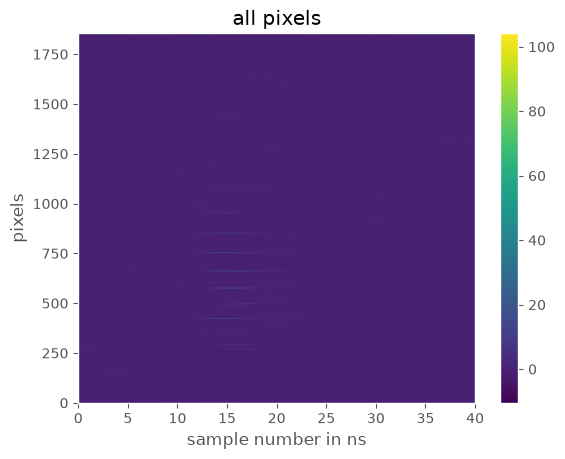

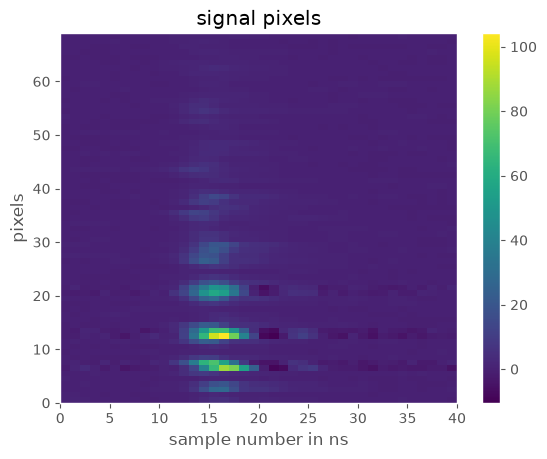

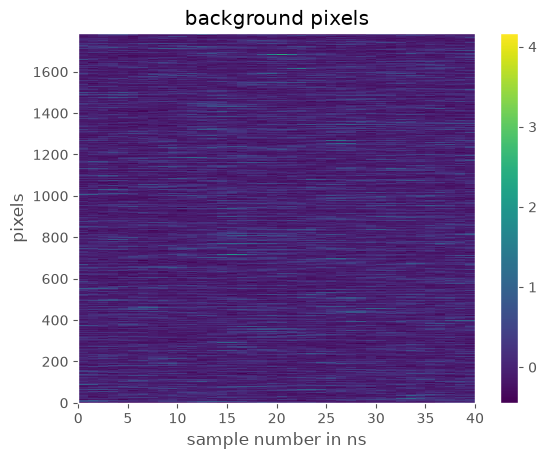

In [7]:
waveforms = {
    "all pixels": calibrated_waveform,
    "signal pixels": calibrated_waveform[signal_pixels],
    "background pixels": calibrated_waveform[background_pixels],
}
for title, waveform in waveforms.items():
    plt.figure()
    plt.pcolormesh(waveform)
    # Note that after selecting specific pixels, the y-axis don not match pixel_ids anymore
    plt.colorbar()
    plt.title(title)
    plt.xlabel("sample number in ns")
    plt.ylabel("pixels")
    plt.show()

#### Plot the waveforms of signal/background pixels in the readout window

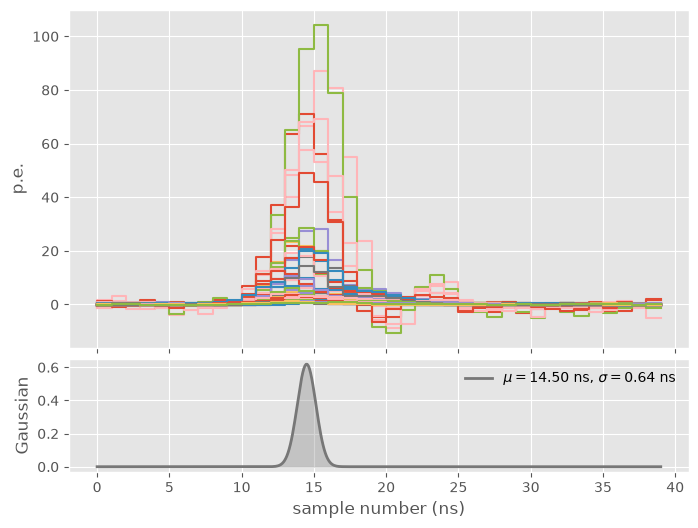

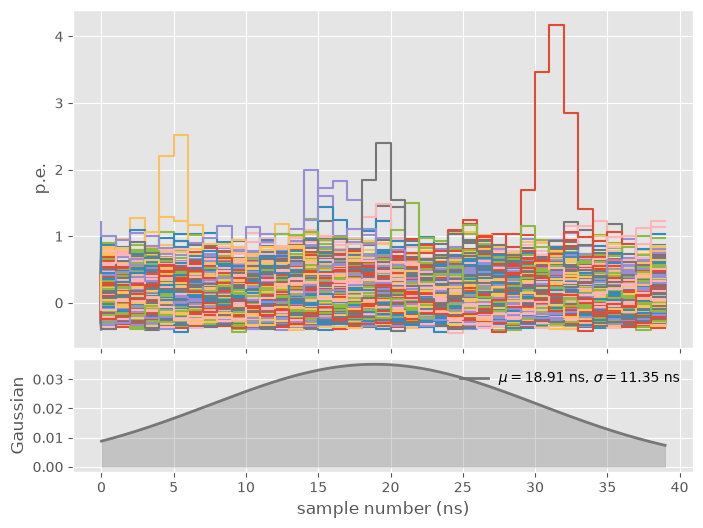

In [8]:
# Plotting the calibrated waveform of signal and background pixels
for selected_pixels in [signal_pixels, background_pixels]:
    fig, (ax1, ax2) = plt.subplots(
        2, 1,
        sharex=True,
        figsize=(8, 6),
        gridspec_kw={"height_ratios": [3, 1], "hspace": 0.05},
    )
    # Top: calibrated waveforms
    for pix_id in selected_pixels:
        ax1.plot(calibrated_waveform[pix_id], drawstyle="steps")
    ax1.set_ylabel("p.e.")
    # Bottom: Gaussian of peak arrival times
    mu, sigma = norm.fit(peak_time[selected_pixels])
    x = np.linspace(0, calibrated_waveform.shape[1] - 1, 500)
    y = norm.pdf(x, mu, sigma)
    ax2.plot(
        x, y,
        color="C3",
        lw=2,
        label=rf"$\mu={mu:.2f}$ ns, $\sigma={sigma:.2f}$ ns"
    )
    ax2.fill_between(x, y, color="C3", alpha=0.3)
    ax2.set_xlabel("sample number (ns)")
    ax2.set_ylabel("Gaussian")
    ax2.legend(loc="upper right", frameon=False)
    plt.show()

#### Plot the shower development in the camera

In [9]:
fig, ax = plt.subplots(figsize=(6, 6))
# First frame
disp = CameraDisplay(
    geometry,
    image=calibrated_waveform[:, 0],
    ax=ax,
    norm="lin",
)
disp.add_colorbar(ax=ax)
disp.set_limits_minmax(
    calibrated_waveform.min(),
    calibrated_waveform.max(),
)
time_text = ax.set_title("t = 0 ns")
def update(frame):
    disp.image = calibrated_waveform[:, frame]
    time_text.set_text(f"t = {frame} ns")
    return disp.pixels, time_text

anim = ani.FuncAnimation(
    fig,
    update,
    frames=calibrated_waveform.shape[1],
    interval=500,      # ms between frames
    blit=False,
)
plt.close(fig)
HTML(anim.to_jshtml())
# Uncomment to save as GIF and show it your friends!
#anim.save("../images/camera_waveform_ctapipe.gif", writer=ani.PillowWriter(fps=500))

### Plot event images (charges or peak arrival times)

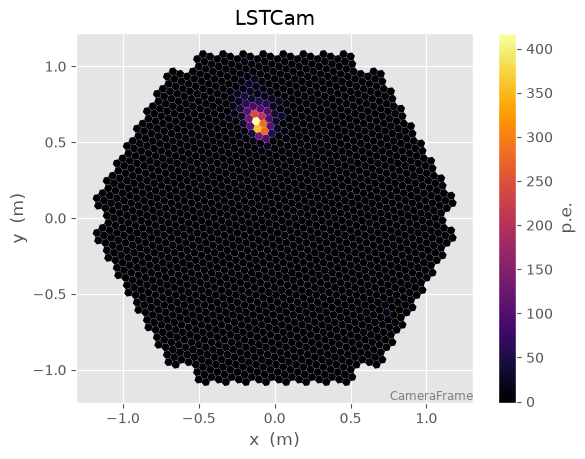

In [10]:
# Plot image charges in photoelectrons
disp = CameraDisplay(geometry, image=image, norm="lin")
disp.add_colorbar(label="p.e.")

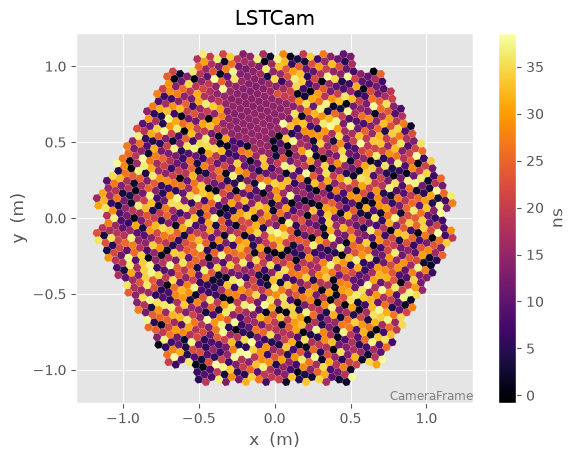

In [11]:
# Plot peak arrival time in nanoseconds
disp = CameraDisplay(geometry, image=peak_time, norm="lin")
disp.add_colorbar(label="ns")

### Plot cleaned images (charges or peak arrival times)

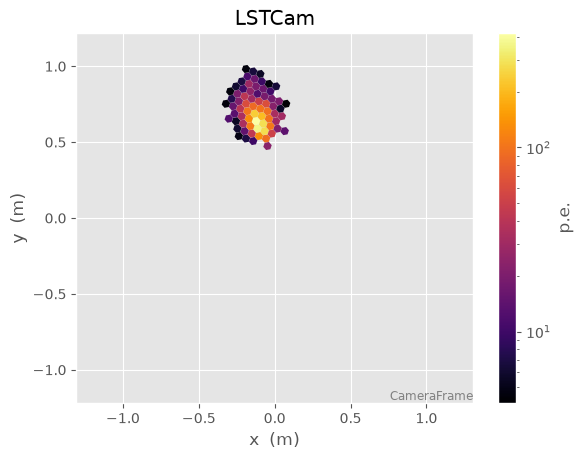

In [12]:
# Plot image charges in photoelectrons after cleaning
disp_cleaned = CameraDisplay(geometry, image=cleaned_image, norm="log")
disp_cleaned.add_colorbar(label="p.e.")

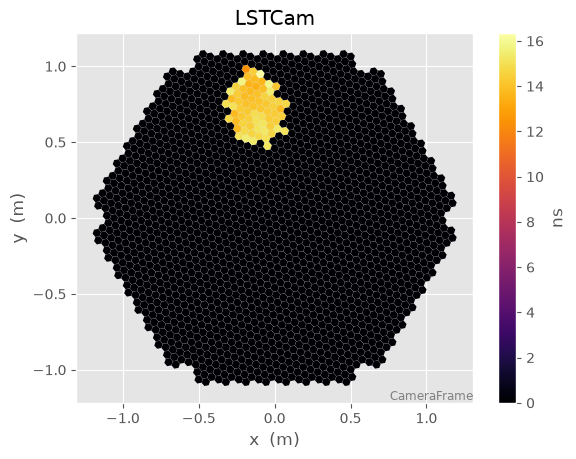

In [13]:
# Plot peak arrival time in nanoseconds after cleaning
disp = CameraDisplay(geometry, image=cleaned_peak_time, norm="lin")
disp.add_colorbar(label="ns")

### Plot shower with hillas parametrization
For a more sophisticated event display with hillas parameters check out:
https://ctapipe.readthedocs.io/en/latest/auto_examples/visualization/hillas.html

(0.15735289254966633, 1.1573528925496663)

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


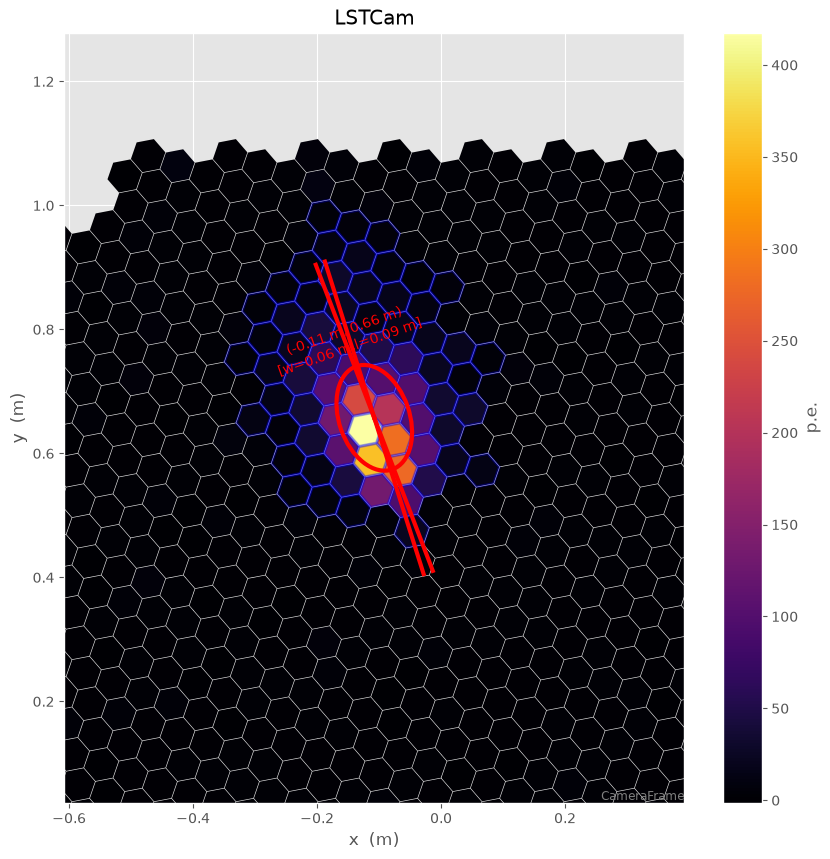

In [14]:
# We recalculate the hillas parameters in the camera frame (in meters), so it is easier to plot with the camera geometry!
image_parameters_camera_frame = hillas_parameters(geometry, cleaned_image)
if print_log:
    print(f"Parameters in camera: {image_parameters_camera_frame}")
    print(f"Parameters in sky (from hdf5 file): {image_parameters}")
plt.figure(figsize=(10, 10))
disp_hillas = CameraDisplay(geometry, image=image)
disp_hillas.add_colorbar(label="p.e.")
disp_hillas.overlay_moments(image_parameters_camera_frame, color="red", lw=3)
disp_hillas.highlight_pixels(image_mask, color="blue", alpha=0.3, linewidth=2)

plt.xlim(image_parameters_camera_frame.x.to_value(u.m) - 0.5, image_parameters_camera_frame.x.to_value(u.m) + 0.5)
plt.ylim(image_parameters_camera_frame.y.to_value(u.m) - 0.5, image_parameters_camera_frame.y.to_value(u.m) + 0.5)

## Exploring the HDF5 file using the ctapipe TableLoader

Besides reading the HDF5 file via a generator, the EventSource, one can also load (chunk-wise) tables. For more information one can check out the dedicated ctapipe tutorial:

 https://ctapipe.readthedocs.io/en/latest/auto_examples/tutorials/tableloader_and_eventsources.html

In [15]:
loader = TableLoader(input_url=filename)
telescope_events = loader.read_telescope_events(
    telescopes=["LST_LST_LSTCam"],
    start=4,
    stop=8,
    dl1_images=True,
    dl1_parameters=False,
    dl1_muons=False,
    dl2=False,
    simulated=False,
    true_images=True,
    true_parameters=False,
    instrument=True,
    observation_info=False,
)
telescope_events.show_in_notebook(
    backend="classic",
    display_length=-1
)

idx,obs_id,event_id,tel_id,time_mono,event_type_mono,n_trigger_pixels,image,peak_time,image_mask,is_valid,true_image_sum,true_image,name,type,pos_x,pos_y,pos_z,camera_name,optics_name_1,tel_description,optics_name_2,size_type,reflector_shape,mirror_area,n_mirrors,n_mirror_tiles,equivalent_focal_length,effective_focal_length,telescope_pointing_azimuth,telescope_pointing_altitude,time,tels_with_trigger,event_type
,,,,,,,,,,,,,,,m,m,m,,,,,,,m2,,,m,m,rad,rad,,,
0,101,1403,1,1650452032.670387,32,-1,2.2 .. 0.3,13.6 .. 7.67,False .. False,True,100,1 .. 0,LST,LST,-6.336,60.405,12.5,LSTCam,LST,LST_LST_LSTCam,LST,LST,PARABOLIC,386.7332458496094,1,198,28.0,29.30565071105957,1.8865263,1.2900252,1650452032.670387,True,32
1,101,1805,1,1650452032.930372,32,-1,0.1 .. 1.0,22.35 .. 35.38,False .. False,True,72,0 .. 0,LST,LST,-6.336,60.405,12.5,LSTCam,LST,LST_LST_LSTCam,LST,LST,PARABOLIC,386.7332458496094,1,198,28.0,29.30565071105957,1.8865263,1.2900252,1650452032.930372,True,32
2,101,2801,1,1650452035.121813,32,-1,3.1 .. 2.9,8.78 .. 25.01,False .. False,True,128,0 .. 0,LST,LST,-6.336,60.405,12.5,LSTCam,LST,LST_LST_LSTCam,LST,LST,PARABOLIC,386.7332458496094,1,198,28.0,29.30565071105957,1.8865263,1.2900252,1650452035.121813,True,32
3,101,2803,1,1650452035.414861,32,-1,0.3 .. 3.2,7.31 .. 1.11,False .. False,True,254,0 .. 0,LST,LST,-6.336,60.405,12.5,LSTCam,LST,LST_LST_LSTCam,LST,LST,PARABOLIC,386.7332458496094,1,198,28.0,29.30565071105957,1.8865263,1.2900252,1650452035.414861,True,32


## Exploring the data files with DL1DH
Besides vitables we can also explore the data with the reading functionality of the DL1DH. This is a cruical part to inspect the previously performed data reduction through ctapipe. With this notebook one can spot corrupted data and ensure that the input provided to CTLearn's CNNs is correct.

In [16]:
LST1_gammafile = f"{DATA_DIR}/hdf5_merged/gamma_theta_16.087_az_108.090_runs1-2.r1.dl1.h5"
LST1_protonfile = f"{DATA_DIR}/hdf5_merged/proton_theta_16.087_az_108.090_runs1-2.r1.dl1.h5"

### Waveform reading
The basic functionality of reading waveforms for a telescope operating in monoscopic mode.

In [17]:
# Configuration settings
config = Config(
    {
        "DLWaveformReader": {
            "sequence_length": 40, # Number of waveform samples
            "sequence_position": "center", # Position of the sequence if 'sequence_length' is selected
            "cleaning_type": None, # Options: "image" (This would apply the DL1 image mask to the calibrated waveform)
            "image_mapper_type": "OversamplingMapper", # Options: "AxialMapper", "BicubicMapper", "BilinearMapper", "NearestNeighborMapper", "OversamplingMapper", "RebinMapper"
        },
    },
)
waveform_mono_reader = DLWaveformReader(
    input_url_signal=[LST1_gammafile],
    input_url_background=[LST1_protonfile],
    config=config,
)
batch = waveform_mono_reader.generate_mono_batch(0)
if print_log:
    print(f"Print 'DLWaveformReader' object: {waveform_mono_reader}")
    print("Print the subarray information of a single LST (LST-1):")
    print(waveform_mono_reader.subarray.info())
    print("Print the simulation information:")
    print("\n".join(waveform_mono_reader.simulation_info.pformat(
        max_lines=-1,
        max_width=-1
    )))
    print(f"Number of signal (gamma) events: {waveform_mono_reader.n_signal_events}")
    print(f"Number of background (proton) events: {waveform_mono_reader.n_bkg_events}")
    print("Generate the first batch and print its content:")
    print("\n".join(batch.pformat(
        max_lines=-1,
        max_width=-1
    )))
cal_waveforms = batch["features"][0]
# Create figure
fig, ax = plt.subplots(figsize=(5, 5))
# First frame
camera_screenshot = cal_waveforms[:, :, 0]
im = ax.imshow(
    camera_screenshot,
    cmap="viridis",
    interpolation="nearest"
)
ax.grid(False)
# Colorbar
cbar = fig.colorbar(
    im,
    ax=ax,
    fraction=0.046,
    pad=0.04
)
cbar.set_label("p.e.", fontsize=12)
# Title
time_text = ax.set_title(
    "Calibrated waveform (t = 0 ns) - dl1dh"
)
def update(frame):
    # Select the camera image for this sample
    camera_screenshot = cal_waveforms[:, :, frame]
    # Update image
    im.set_data(camera_screenshot)
    # Update color scale for this frame
    im.set_clim(
        camera_screenshot.min(),
        camera_screenshot.max()
    )
    # Update title
    time_text.set_text(
        f"Calibrated waveform (t = {frame} ns) - dl1dh"
    )
    return im, time_text
# Create animation
anim = ani.FuncAnimation(
    fig,
    update,
    frames=cal_waveforms.shape[-1],
    interval=500,   # milliseconds between frames
    blit=False
)
# Prevent the static matplotlib figure from also being displayed
plt.close(fig)
# Display animation in the notebook
HTML(anim.to_jshtml())
# Uncomment to save as GIF and show it your friends!
#anim.save("../images/camera_waveform_dl1dh.gif", writer=ani.PillowWriter(fps=500))

### Image reading
The basic functionality of reading images for a telescope operating in monoscopic mode. 

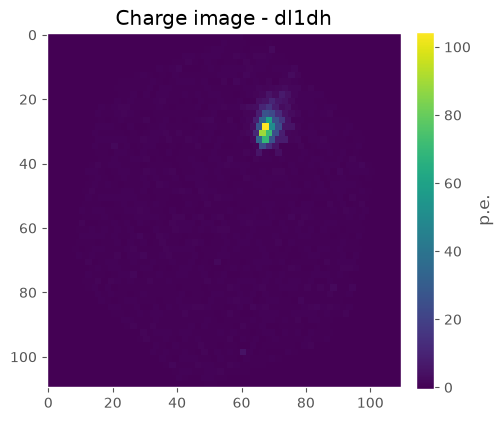

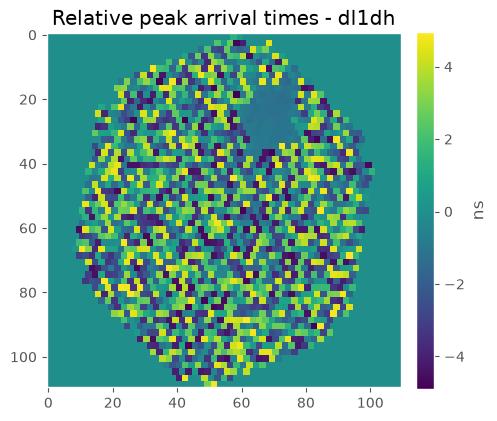

In [18]:
# Configuration settings
config = Config(
    {
        "DLImageReader": {
            "channels": ["image", "relative_peak_time"], # Options: ["image", "log_image", "cleaned_image", "log_cleaned_image", "peak_time", "relative_peak_time", "cleaned_peak_time", "cleaned_relative_peak_time"]
            "image_mapper_type": "OversamplingMapper", # Options: "AxialMapper", "BicubicMapper", "BilinearMapper", "NearestNeighborMapper", "OversamplingMapper", "RebinMapper"
        },
    },
)
# Init the DLImageReader class with the configuration above
mono_reader = DLImageReader(
    input_url_signal=[LST1_gammafile],
    input_url_background=[LST1_protonfile],
    config=config,
)
batch = mono_reader.generate_mono_batch(0)
if print_log:
    print(f"Print 'DLImageReader' object: {mono_reader}")
    print("Print the subarray information of a single LST (LST-1):")
    print(mono_reader.subarray.info())
    print("Print the simulation information:")
    print("\n".join(mono_reader.simulation_info.pformat(
        max_lines=-1,
        max_width=-1
    )))
    print(f"Number of signal (gamma) events: {mono_reader.n_signal_events}")
    print(f"Number of background (proton) events: {mono_reader.n_bkg_events}")
    print("Generate the first batch and print its content:")
    print("\n".join(batch.pformat(
        max_lines=-1,
        max_width=-1
    )))
# Plot the integrated image charges
charge_image = batch["features"][0, :, :, 0]
fig, ax = plt.subplots(figsize=(5, 5))
im = ax.imshow(charge_image, cmap="viridis")
ax.set_title("Charge image - dl1dh")
ax.grid(False)
cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label("p.e.", fontsize=12)
plt.show()
# Plot the relative peak arrival times
rel_peak_arrival_times = batch["features"][0, :, :, 1]
fig, ax = plt.subplots(figsize=(5, 5))
im_time = ax.imshow(rel_peak_arrival_times, cmap="viridis")
ax.set_title("Relative peak arrival times - dl1dh")
ax.grid(False)
cbar = fig.colorbar(im_time, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label("ns", fontsize=12)
plt.show()
